# Exploratory Analysis of YouTube Unstructured Data

## Importing libraries

In [55]:
import pandas as pd
import numpy as np
import string 
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import axes3d

## Creating functions

In [2]:
# get list of deciles from a distribution
def get_decile(dist):
    decile = []
    for nth in np.arange(0, 1, 0.1):
        decile.append(np.quantile(dist, nth))
    return decile

In [3]:
# create dictionary from df as key(category column):value(other column)
def col_to_dict_by_cat(data, group):
    my_dict = {}
    for i in group.unique():
        my_dict[i] = data[group == i]  
    return my_dict

In [4]:
# plots worldclouds where metric is above/below a list (rows) of boundary pairs (columns)
def plot_top_bottom_wordcloud(text, metric, tails, text_name='Text', metric_name='Metric', extra_label=''):

    nrow = len(tails)
    ncol = len(tails[0])

    plt.figure(figsize=(20, nrow*5))
    stitle = 'Most Used Words in '+text_name+'\n'
    plt.suptitle(stitle)
    
    wc = 1
    for r in range(nrow):
        for c in range(ncol):
        
            if (c%2)==0:
                text_list = text[metric>tails[r][c]]
                direction = 'More Than'
            else:
                text_list = text[metric<tails[r][c]]
                direction = 'Less Than'

            if len(text_list) !=0:
                words = ' '.join(text_list)
            else:
                words = 'Na'

            plt.subplot(nrow, ncol, wc)
            wcloud = WordCloud(width=800, height=400,max_words=30).generate(words)
            plt.imshow(wcloud)
            plt.axis('off')
            title = ' '.join([' with', direction, str(round(tails[r][c])), metric_name, extra_label])
            plt.title(title)
            wc += 1

    plt.tight_layout(pad=0.1)
    plt.show()

In [5]:
# plots worldclouds by a categorical variable (rows) where metric is above/below a list of boundary pairs (columns) 
def plot_top_bottom_wordcloud_by_cat(text, category, metric, tails, 
                                     text_name='Text', category_name='Category', metric_name='Metric'):
    
    text_dict = col_to_dict_by_cat(text, category)
    metric_dict = col_to_dict_by_cat(metric, category)

    nrow = len(text_dict.keys())
    ncol = len(tails)

    plt.figure(figsize=(20, nrow*5))
    stitle = 'Most Used Words in '+text_name+' by '+category_name+'\n'
    plt.suptitle(stitle)

    wc = 1
    for k, r in zip(text_dict.keys(), range(nrow)):   
        for t, c in zip(tails, range(ncol)):

            if c==0:
                text_list = text_dict[k][metric_dict[k]>t]
                direction = 'More Than'
            else:
                text_list = text_dict[k][metric_dict[k]<t]
                direction = 'Less Than'

            if len(text_list) !=0:
                words = ' '.join(text_list)
            else:
                words = 'Na'

            plt.subplot(nrow, ncol, wc)
            wcloud = WordCloud(width=800, height=400,max_words=30).generate(words)
            plt.imshow(wcloud)
            plt.axis('off')
            title = ' '.join([' with', direction, str(round(tails[c])), metric_name, 'in the', k.upper(), 'Category'])
            plt.title(title)
            wc +=1

    plt.tight_layout(pad=0.1)
    plt.show()

## Loading pre-processed dataset

In [69]:
vid = pd.read_csv('./videos-with-comments-aggr.csv',  index_col=0)

In [70]:
vid.head()

,id,title,date,tag,views,likes,comments,comment,mean_comment_likes,mean_comment_sentiment,unicode_title,unicode_comment,likes_per_view,comments_per_view,views_above_mean,likes_above_mean,comments_above_mean,days_old
0,wAZZ-UWGVHI,Apple Pay Is Killing the Physical Wallet After...,2022-08-23,tech,135612.0,3407.0,672.0,Let's not forget that Apple Pay in 2014 requir...,39.1,1.2,Apple Pay Is Killing the Physical Wallet After...,Let's not forget that Apple Pay in 2014 requir...,0.025123,0.004955,False,False,False,1
1,b3x28s61q3c,The most EXPENSIVE thing I own.,2022-08-24,tech,1758063.0,76779.0,4306.0,"Wow, you really went to town on the PSU test r...",598.2,1.8,The most EXPENSIVE thing I own.,"Wow, you really went to town on the PSU test r...",0.043672,0.002449,False,False,False,0
2,4mgePWWCAmA,My New House Gaming Setup is SICK!,2022-08-23,tech,1564007.0,63825.0,3338.0,Linus!!! Just turn the key lights 180 and bou...,626.2,1.9,My New House Gaming Setup is SICK!,Linus!!! Just turn the key lights 180 and bou...,0.040809,0.002134,False,False,False,1
3,kXiYSI7H2b0,Petrol Vs Liquid Nitrogen | Freezing Experimen...,2022-08-23,tech,922918.0,71566.0,1426.0,Unstoppable experiments with liquid nitrogen 🎉...,528.8,1.6,Petrol Vs Liquid Nitrogen | Freezing Experimen...,Unstoppable experiments with liquid nitrogen 🎉...,0.077543,0.001545,False,False,False,1
4,ErMwWXQxHp0,Best Back to School Tech 2022!,2022-08-08,tech,1855644.0,96513.0,5155.0,"Guys, a quick note that you do NOT need all th...",2721.7,1.6,Best Back to School Tech 2022!,"Guys, a quick note that you do NOT need all th...",0.052011,0.002778,False,False,False,16


## Title words popularity

In [19]:
views_decile = get_decile(vid.views)
likes_decile = get_decile(vid.likes)
comments_decile = get_decile(vid.comments)
views_decile

[25.0,
 21298.4,
 56846.8,
 129375.00000000003,
 287151.00000000006,
 591721.0,
 1058310.8,
 1871284.6000000015,
 4396172.200000003,
 11583851.200000005]

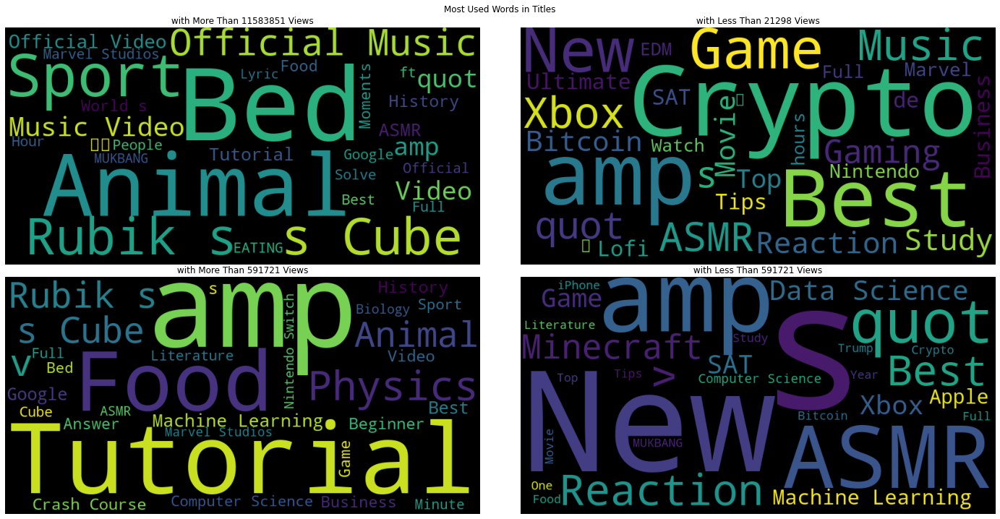

In [20]:
views_boundaries = [[views_decile[9],views_decile[1]],
                    [views_decile[5],views_decile[5]]]

plot_top_bottom_wordcloud(text=vid.title, metric=vid.views, tails=views_boundaries,
                          text_name='Titles', metric_name='Views', extra_label='')

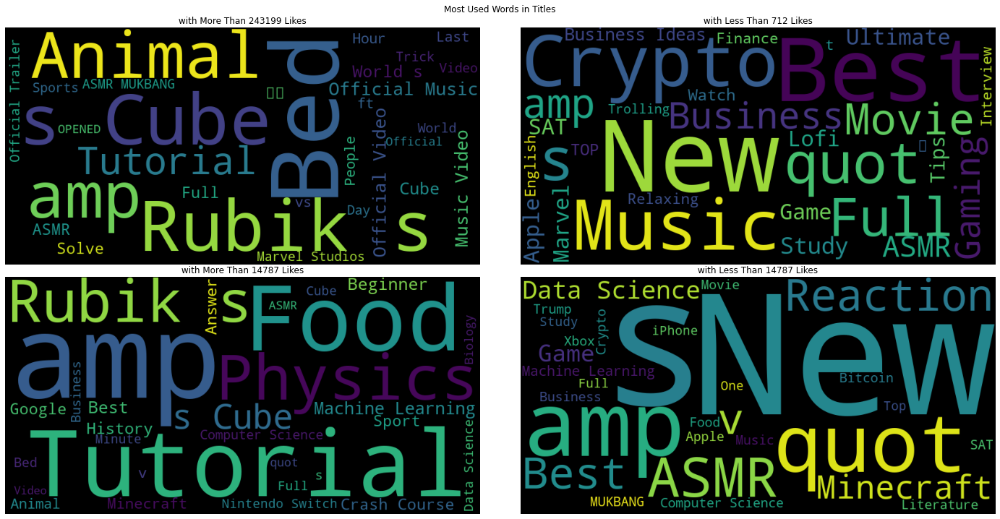

In [21]:
likes_boundaries = [[likes_decile[9],likes_decile[1]],
                    [likes_decile[5],likes_decile[5]]]

plot_top_bottom_wordcloud(text=vid.title, metric=vid.likes, tails=likes_boundaries,
                          text_name='Titles', metric_name='Likes', extra_label='')

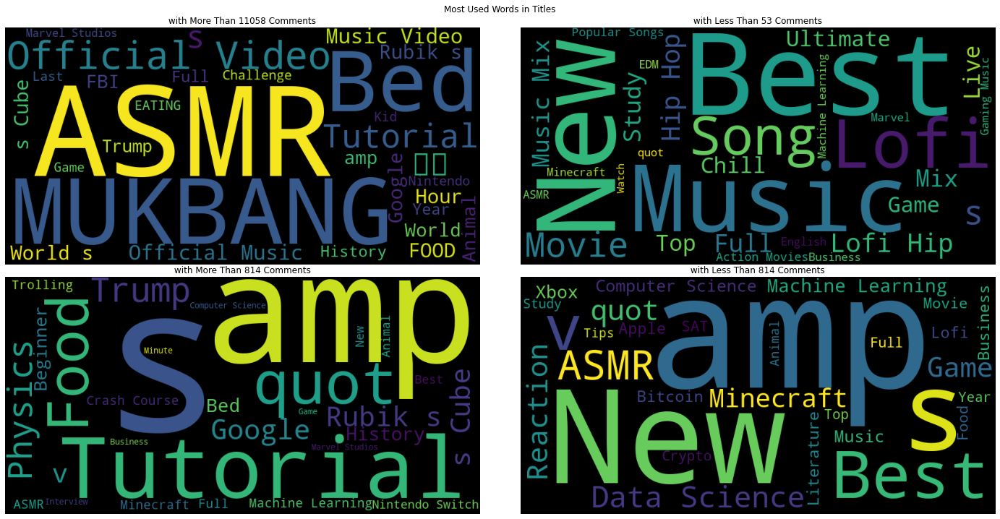

In [22]:
comments_boundaries = [[comments_decile[9],comments_decile[1]], 
                       [comments_decile[5],comments_decile[5]]]

plot_top_bottom_wordcloud(text=vid.title, metric=vid.comments, tails=comments_boundaries,
                          text_name='Titles', metric_name='Comments', extra_label='')

## Title words popularity by Tag

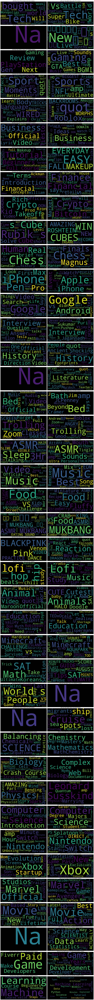

In [23]:
views_tails = [views_decile[8],views_decile[2]]

plot_top_bottom_wordcloud_by_cat(text=vid.title, category=vid.keyword, metric=vid.views, tails=views_tails,
                                 text_name='Title', category_name='Keyword', metric_name='Views')